# Import dependencies

In [1]:
#!pip install category_encoders

The following libraries are imported here:

Pandas: A library providing high-performance, easy-to-use data structures and data analysis tools.

NumPy: A library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays.

pandas_profiling = ydata_profiling: This seems to be a typo or a less common library. It's likely you meant pandas_profiling, which is an exploratory data analysis tool that generates interactive reports about the data.

train_test_split: A function from sklearn.model_selection used to split datasets into training and testing subsets.

Matplotlib: A plotting library for the Python programming language and its numerical mathematics extension NumPy. Used for creating static, interactive, and animated visualizations in Python.

LinearRegression: A linear approach to modelling the relationship between a scalar response (or dependent variable) and one or more explanatory variables (or independent variables). The case of one explanatory variable is called simple linear regression.

accuracy_score: A function from sklearn.metrics, used to calculate the accuracy of classification models. It's not typically used for regression models (like those created with LinearRegression), where other metrics like RMSE (Root Mean Squared Error) or R-squared are more appropriate.

In [2]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score

In [3]:
df = pd.read_excel('furniture sales\Sample - Superstore-newdate.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2016-152156,2022-11-07,2022-11-10,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2016-152156,2022-11-07,2022-11-10,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2016-138688,2022-06-11,2022-06-15,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2015-108966,2021-10-09,2021-10-16,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2015-108966,2021-10-09,2021-10-16,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


# Exploring the dataset

In [4]:
df['Profit_margin'] = df['Profit'] / df['Sales']
df['Original_Price'] = df['Sales'] / (1 - df['Discount'])
#df['original_per_unit_price'] = df['Original_Price'] / df['Quantity']

For this forecast we only used the Original_Price. This is the price before any discounts were given.

In [5]:
df['order_month'] = df['Order Date'].dt.month
df['order_year'] = df['Order Date'].dt.year

Here we extract the month and the year from the order date. We only use the month and year for the forcasting model.

In [6]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Why Use df.profile_report()?

Comprehensive Data Overview: It provides a bird's-eye view of the dataset, presenting the essentials like the number of variables, observations, missing values, and duplicate rows.

Variable Properties: Each variable (column) in the dataset is analyzed individually, showing statistics such as central tendency measures (mean, median), dispersion measures (variance, standard deviation), quantiles, and distributions. This helps in understanding the data's shape and identifying potential outliers or anomalies.

Correlations: The report includes correlation matrices (like Pearson, Spearman, and Kendall) that highlight how variables relate to one another. This is crucial for detecting multicollinearity, which can impact model performance.

Missing Data: It provides detailed insights into missing values, including their distribution and impact on the dataset. This aids in devising strategies for handling missing data, such as imputation or deletion.

Duplicate Rows: Identifies and counts duplicate observations, which are often problematic as they can skew analysis results.

Variable Interactions: Visualizes interactions between variables, which can uncover interesting patterns and relationships not apparent from individual analyses.

Sample Data: Includes samples of the data (head and tail of the DataFrame), offering a quick snapshot of the data's format and content.

Use Cases
Initial Data Analysis: Ideal for getting acquainted with a new dataset, understanding its structure, content, and potential issues.
Data Cleaning: Helps identify areas that require cleaning or transformation, such as handling missing values, duplicates, or outliers.
Feature Selection: Insights into correlations and variable importance can guide the selection of features for machine learning models.

# Cleaning the dataset and removing outliers

In [7]:
def analyze_and_filter_column(df, column_name):
    # Convert column to list and plot boxplot
    column_data = df[column_name].tolist()
    fig, ax = plt.subplots()
    ax.set_title(f'{column_name} Boxplot')
    ax.set_ylabel(column_name)
    ax.boxplot(column_data)
    plt.show()

    # Calculate quartiles and IQR
    quartiles = df[column_name].quantile([.25, .5, .75])
    lowerq = quartiles[0.25]
    upperq = quartiles[0.75]
    iqr = upperq - lowerq

    # Print quartile information
    print(f"The lower quartile of {column_name} is: {lowerq}")
    print(f"The upper quartile of {column_name} is: {upperq}")
    print(f"The interquartile range of {column_name} is: {iqr}")
    print(f"The median of {column_name} is: {quartiles[0.5]} ")

    # Identify potential outliers
    lower_bound = lowerq - (1.5 * iqr)
    upper_bound = upperq + (1.5 * iqr)
    print(f"Values below {lower_bound} could be outliers.")
    print(f"Values above {upper_bound} could be outliers.")

    # Filter out potential outliers
    df_filtered = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]
    df_filtered = df_filtered.copy()

    # Return the filtered and binned DataFrame
    return df_filtered

Parameters
df: The pandas DataFrame containing the data.
column_name: The name of the column to be analyzed and filtered.
Process
Convert Column to List and Plot Boxplot:

The specified column is converted into a list using tolist().
A boxplot for this column is then created using Matplotlib, providing a visual representation 
of the distribution, central value, and variability of the data. The boxplot also helps in visually identifying outliers.
Calculate Quartiles and IQR:

The function calculates the first quartile (25th percentile), median (50th percentile), and third 
quartile (75th percentile) of the column data.
The Interquartile Range (IQR) is computed as the difference between the third and first quartiles. 
The IQR is used to measure the variability and to identify outliers.
Print Quartile Information:

It prints out the calculated lower quartile, upper quartile, IQR, and median of the column. 
This provides a textual summary of the data distribution.
Identify Potential Outliers:

Potential outliers are identified based on the calculated IQR. Any data point lying below 
(lower quartile - 1.5 * IQR) or above (upper quartile + 1.5 * IQR) is considered a potential outlier.
It prints the values that could be considered as lower and upper bounds for outliers.
Filter Out Potential Outliers:

The DataFrame is filtered to exclude rows where the column values are outside the bounds 
identified in the previous step.
This results in a DataFrame (df_filtered) that excludes potential outliers.
Return Statement:

Finally, the function returns the filtered DataFrame, which excludes the identified potential 
outliers from the specified column.

In [8]:
column_name = 'Original_Price'
df = df.copy()
df = analyze_and_filter_column(df, column_name)

The lower quartile of Original_Price is: 21.36
The upper quartile of Original_Price is: 251.91
The interquartile range of Original_Price is: 230.55
The median of Original_Price is: 64.96 
Values below -324.46500000000003 could be outliers.
Values above 597.735 could be outliers.


C:\Users\yoeri\AppData\Local\Temp\ipykernel_24028\1531172447.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


Here we call the previously mentioned and created function. Getting rid of the outliers and generatin a boxplot to visualize the value distribution. 

In [9]:
df = df.drop(columns=["Discount", 'Row ID', 'Postal Code', 'Sales', 'Profit', 'Profit_margin',
                       "Order ID",'State', "Customer ID", "City", "Product Name", "Product ID", 
                      'Country',"Customer Name","Ship Date",'Ship Mode','Segment'
                     ,'Quantity','Order Date'])

We are dropping the columns we do not need for our forcast.

In [10]:
df_2 = df.copy()

Here wqe are splitting the dataset.

In [11]:
df.head()

,Region,Category,Sub-Category,Original_Price,order_month,order_year
0,South,Furniture,Bookcases,261.96,11,2022
2,West,Office Supplies,Labels,14.62,6,2022
4,South,Office Supplies,Storage,27.96,10,2021
5,West,Furniture,Furnishings,48.86,6,2020
6,West,Office Supplies,Art,7.28,6,2020


# Preparing the dataset for the first model

In [12]:
df = pd.get_dummies(df, columns=['Region','Category','Sub-Category'])

pd.get_dummies() is a utility function that converts categorical data into a format that can be provided to machine learning algorithms to do a better job in prediction. It creates a new column for each unique value in the specified column(s) and assigns a 1 or 0 (True/False) indicating the presence of that value in the original row.

In [13]:
description = df.describe()
description

,Original_Price,order_month,order_year,Region_Central,Region_East,Region_South,Region_West,Category_Furniture,Category_Office Supplies,Category_Technology,...,Sub-Category_Envelopes,Sub-Category_Fasteners,Sub-Category_Furnishings,Sub-Category_Labels,Sub-Category_Machines,Sub-Category_Paper,Sub-Category_Phones,Sub-Category_Storage,Sub-Category_Supplies,Sub-Category_Tables
count,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,...,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000,8793.000000
mean,110.490945,7.769589,2021.731150,0.233026,0.283294,0.162971,0.320710,0.183555,0.652565,0.163880,...,0.028773,0.024679,0.105652,0.041169,0.004208,0.155351,0.078130,0.083021,0.020130,0.016945
std,134.803801,3.274887,1.122827,0.422783,0.450623,0.369360,0.466776,0.387143,0.476183,0.370188,...,0.167177,0.155153,0.307409,0.198692,0.064735,0.362259,0.268392,0.275929,0.140452,0.129074
min,0.990000,1.000000,2020.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,19.050000,5.000000,2021.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,49.530000,9.000000,2022.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,149.950000,11.000000,2023.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,597.000000,12.000000,2023.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


df.describe() generates descriptive statistics that summarize the central tendency, dispersion, and shape of a dataset’s distribution, excluding NaN (Not a Number) values. It is typically used on numeric columns but can also handle categorical data by providing summary statistics like count, unique, top, and freq for object datatype columns.

In [14]:
target = 'Original_Price'
features = df.columns.drop(target)
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.75, test_size=0.25, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((6594, 26), (2199, 26), (6594,), (2199,))

Define Target and Features
target = 'Original_Price': This line specifies the target variable (or the dependent variable) that the model aims to predict. In this case, the target variable is 'Original_Price'.

features = df.columns.drop(target): Here, df.columns.drop(target) creates a list of all column names in the DataFrame df except for the target column 'Original_Price'. This list represents the features (or independent variables) that will be used to predict the target variable.

Split DataFrame into Features and Target
X = df[features]: This line extracts all columns in df except 'Original_Price' and assigns them to X, which represents the features matrix.

y = df[target]: This extracts the target column 'Original_Price' from df and assigns it to y, which represents the target vector.

Split Data into Training and Testing Sets
X_train, X_test, y_train, y_test = train_test_split(...): The train_test_split function from sklearn.model_selection is used to randomly split the features (X) and target (y) into training and testing sets. The parameters used are:
X, y: The features and target data to split.
train_size=0.75: This specifies that 75% of the data will be used for training.
test_size=0.25: This specifies that 25% of the data will be used for testing.
random_state=42: This is a seed for the random number generator to ensure reproducibility of the results. By using the same random_state, you can ensure that the split will be the same every time the code is run.
Shape of the Split Data
X_train.shape, X_test.shape, y_train.shape, y_test.shape: Finally, this part returns the shapes (i.e., the number of rows and columns) of the training and testing sets for both features (X_train, X_test) and target (y_train, y_test). This is useful for verifying that the data has been split as expected.

In [15]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

Creating the Linear Regression Model
model = LinearRegression(): This line initializes a new instance of the LinearRegression class. LinearRegression is a linear approach to modeling the relationship between a dependent variable and one or more independent variables. By default, it attempts to minimize the residual sum of squares between the observed targets in the dataset and the targets predicted by the linear approximation.
Training the Model
model.fit(X_train, y_train): This line trains the linear regression model using the training data. The fit method takes two arguments: X_train and y_train.
X_train contains the feature variables for the training set. It's a matrix where each row represents a sample and each column represents a feature.
y_train contains the target variable for the training set. It's a vector, where each element is the target value for one sample.
The Training Process
During training, the linear regression model learns the coefficients (weights) for each feature variable and the intercept (bias) term that best fit the training data, according to the least squares criterion. This means it finds the line (or hyperplane, in the case of multiple features) that minimizes the sum of the squared differences between the observed actual outcomes in the dataset and the outcomes predicted by the linear model.

In [16]:
model.score(X_test, y_test)

0.3326746431992271

The model.score Method
model.score(X_test, y_test): This method calculates the coefficient of determination, also known as 
2R2
  or R-squared, of the prediction. The score function requires two arguments:
X_test: The features of the test dataset. This is a set of data points that the model hasn't seen during training, used to evaluate how well the model generalizes to new, unseen data.
y_test: The true values for the target variable corresponding to X_test. These are used to compare against the model's predictions.
What Does 2R2 Indicate?
The 2R2 score is a statistical measure that represents the proportion of the variance for the dependent variable that's explained by the independent variables in the model. In simpler terms, it shows how well the observed outcomes are replicated by the model, based on the proportion of total variation of outcomes explained by the model.
�2R2 values range from 0 to 1, where:
A score of 1 indicates that the model perfectly predicts the target variable.
A score of 0 means that the model is no better at predicting the target than a simple mean of the target values.
Negative 
�2R2 values can occur when the chosen model does not follow the trend of the data, so the predictions are worse than simply choosing the mean of the target variable.

# Outcome Linear regression model

0.3326746431992271 we can see this model is not very accurte with a .33 accuracy score. 

# Preparing the dataset for model 2

In [17]:
df_2.head()

,Region,Category,Sub-Category,Original_Price,order_month,order_year
0,South,Furniture,Bookcases,261.96,11,2022
2,West,Office Supplies,Labels,14.62,6,2022
4,South,Office Supplies,Storage,27.96,10,2021
5,West,Furniture,Furnishings,48.86,6,2020
6,West,Office Supplies,Art,7.28,6,2020


In [26]:
assert df_2.shape == (8793, 6)

Components of the Assertion

assert: This is a keyword in Python used to set up an assertion. An assertion is a sanity-check that you can turn on or off when you have finished testing the program. The idea is to let the program test itself. If the condition following the assert keyword evaluates to True, nothing happens, and your program continues to execute as normal. However, if the condition evaluates to False, an AssertionError exception is raised, interrupting the program.
df_2.shape: This part of the statement accesses the .shape attribute of the DataFrame df_2. The .shape attribute returns a tuple representing the dimensions of the DataFrame, where the first element is the number of rows and the second element is the number of columns.
(8793, 6): This is a tuple representing the expected dimensions of the DataFrame df_2 — 8,793 rows and 6 columns.
Purpose and Use Case
The purpose of this assertion is to ensure that the DataFrame df_2 has exactly 8,793 rows and 6 columns. This kind of assertion is particularly useful in scenarios where the dimensions of a DataFrame are critical to subsequent operations or analyses. For example, you might use this after cleaning data, merging tables, or performing operations that filter rows or columns, to verify that the operation resulted in the expected structure.
If the actual shape of df_2 matches the expected shape (8793, 6), the program will continue to execute normally. If not, an AssertionError will be raised, potentially with a message if one is provided (though no message is provided in this snippet).
Implications
Using assertions is a good practice for debugging and ensuring the integrity of your data throughout the execution of a program, especially in data processing pipelines where transformations might depend on the data having certain dimensions.

In [27]:
from sklearn.metrics import mean_absolute_error, r2_score
target = 'Original_Price'
y = df_2[target]
y_pred = [y.mean()] * len(y)
print('Mean Baseline:')
print('Mean Absolute Error', mean_absolute_error(y, y_pred))
print('R^2 score', r2_score(y, y_pred))

Mean Baseline:
Mean Absolute Error 102.2255728551483
R^2 score 0.0


Define the Target Variable
target = 'Original_Price': This line sets the name of the target variable that the model aims to predict. In this context, 'Original_Price' is the column in the DataFrame df_2 that contains the dependent variable's values.
Prepare Target Data
y = df_2[target]: This extracts the actual values of the target variable from df_2 and stores them in y.
Create Predictions Based on the Mean
y_pred = [y.mean()] * len(y): This line creates a list of predictions y_pred, where every predicted value is the mean of the actual target values y. The length of this list is the same as the number of observations in y, ensuring that there's a one-to-one correspondence between actual and predicted values. This represents a simple baseline prediction strategy, where you assume every prediction is the average of the observed values.
Evaluate and Print Metrics
print('Mean Baseline:'): Prints a header for the output, indicating that the following metrics are for the mean baseline model.
mean_absolute_error(y, y_pred): Calculates the MAE between the actual and predicted values. It reflects the average absolute difference between actual and predicted values, giving an idea of how large errors are on average.
r2_score(y, y_pred): Calculates the 
2R2 score of the predictions. For this baseline model, the 
2R2 score is expected to be 0, as 
2R2 measures the proportion of the variance for the dependent variable that's explained by the independent variables in the model, and a mean prediction explains none of the variance.

Summary The snippet effectively evaluates how good (or rather, how basic) a baseline model—predicting every value to be the average of the target variable—performs according to MAE and 
2R2   score. This approach is often used as a starting point in regression analysis to provide a benchmark for comparing the performance of more complex models. If a more sophisticated model does not perform significantly better than this simple baseline, it may indicate issues with the model, the features chosen, or the data itself.

In [28]:
train = df_2[df_2['order_year'] <= 2021]
val = df_2[df_2['order_year'] == 2022]
test = df_2[df_2['order_year'] == 2023]
train.shape, val.shape, test.shape

((3568, 6), (2284, 6), (2941, 6))

Splitting the DataFrame
train = df_2[df_2['order_year'] <= 2021]: This line creates the training set by selecting all rows from df_2 where the order_year is less than or equal to 2021. The training set is used to fit the machine learning model. It includes data up to the year 2021, assuming that this historical data will help the model learn the necessary patterns to make predictions.

val = df_2[df_2['order_year'] == 2022]: This line creates the validation set by selecting all rows from df_2 where the order_year equals 2022. The validation set is typically used to tune model parameters, perform feature selection, and provide an unbiased evaluation of a model fit on the training dataset while tuning the model's hyperparameters.

test = df_2[df_2['order_year'] == 2023]: This line creates the test set by selecting all rows from df_2 where the order_year equals 2023. The test set is used to provide an unbiased evaluation of a final model fit on the training dataset. It simulates the future, unseen data to evaluate how well the model is expected to perform in real-world applications.

Checking the Shapes of the Splits
train.shape, val.shape, test.shape: After splitting the data, this line retrieves and displays the shape (i.e., the number of rows and columns) of each subset.

In [29]:
import pandas_profiling
train.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We are using the pandas profiling rep;ort again on the df_2 dataset.

In [30]:
features = ['Region','Category','Sub-Category']
target = 'Original_Price'

X_train = train[features]
X_val = val[features]
X_test = test[features]

y_train = train[target] 
y_val = val[target]
y_test = test[target]

Defining Features and Target
features = ['Region','Category','Sub-Category']: This line defines a list of column names that are considered as features (independent variables) for the machine learning model. These columns are expected to influence or predict the target variable.

target = 'Original_Price': Sets the name of the target variable (dependent variable) that the model aims to predict. This is the variable that the machine learning model will try to forecast based on the input features.

Splitting Data into Features and Target for Each Set
X_train = train[features]: Creates the feature matrix X_train for the training set by selecting the specified columns ('Region', 'Category', 'Sub-Category') from the train DataFrame. This matrix contains the data that the model will learn from.

X_val = val[features]: Similarly, creates the feature matrix X_val for the validation set. The validation set features are used to tune the model's parameters and make decisions about the model to prevent overfitting.

X_test = test[features]: Creates the feature matrix X_test for the test set. This set is used to evaluate the final model's performance, simulating how the model would perform on unseen data.

y_train = train[target]: Extracts the target values y_train for the training set. These are the actual values that correspond to the features in X_train, which the model will try to predict during training.

y_val = val[target]: Extracts the target values y_val for the validation set. The validation target is used alongside X_val to tune the model's settings and evaluate its performance during the validation phase.

y_test = test[target]: Extracts the target values y_test for the test set. This is the final set of actual values used to assess how well the trained model can predict new, unseen data.

In [31]:
# category_encoders is recommended, but not required
import category_encoders as ce

In [32]:
# use fit_transform method with train set
# use transform method with val / test sets 
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)

Initializing the OneHotEncoder

encoder = ce.OneHotEncoder(use_cat_names=True): This line initializes a OneHotEncoder object with the parameter use_cat_names=True. The category_encoders library is a set of scikit-learn-style transformers for encoding categorical variables into numeric by different techniques. The parameter use_cat_names=True instructs the encoder to create new column names using the original category names for easier interpretation. Without this, the new columns would be named after the order in which categories appear, which can be less intuitive.
Encoding the Training Data
X_train_encoded = encoder.fit_transform(X_train): The fit_transform method is applied to the training feature set X_train. This method performs two key operations:
fit: Learns the mappings from the categories in the features to the new one-hot encoded columns. This involves identifying all unique categories in each feature column.
transform: Applies these mappings to X_train, converting each categorical value to a one-hot encoded vector. The result, X_train_encoded, is a DataFrame where categorical columns are replaced by one or more new columns for each unique category, and each row has a 1 in the column corresponding to its category and 0s in all other newly created columns.
Encoding the Validation Data
X_val_encoded = encoder.transform(X_val): The transform method is used on the validation feature set X_val. Unlike fit_transform, transform does not learn any new mappings; it uses the mappings learned during the fit phase on the training set. This ensures consistency in encoding across training and validation/test sets, which is crucial for the model's performance. The resulting X_val_encoded DataFrame has the same new one-hot encoded columns as X_train_encoded, but the encoded values correspond to the X_val data.
Summary
The purpose of this snippet is to correctly apply one-hot encoding to categorical variables in a machine learning dataset, ensuring that:

In [33]:
X_train_encoded.head()

,Region_South,Region_West,Region_Central,Region_East,Category_Office Supplies,Category_Furniture,Category_Technology,Sub-Category_Storage,Sub-Category_Furnishings,Sub-Category_Art,...,Sub-Category_Chairs,Sub-Category_Labels,Sub-Category_Accessories,Sub-Category_Paper,Sub-Category_Fasteners,Sub-Category_Supplies,Sub-Category_Tables,Sub-Category_Machines,Sub-Category_Bookcases,Sub-Category_Copiers
4,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
6,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
# Ridge Regression:
# Don't need to do Ridge & Linear, just one or the other
# You should scale features when doing regularized regression,
# but it's not required for this Sprint Challenge

from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

ridge = RidgeCV()
ridge.fit(X_train_scaled, y_train)

RidgeCV()

Scaling the Features

from sklearn.preprocessing import StandardScaler: This line imports the StandardScaler class from scikit-learn, a Python library widely used for machine learning. StandardScaler standardizes features by removing the mean and scaling to unit variance, which is crucial for models that are sensitive to the scale of input features, like Ridge regression.

scaler = StandardScaler(): Initializes an instance of StandardScaler.

X_train_scaled = scaler.fit_transform(X_train_encoded): The fit_transform method computes the mean and standard deviation for each feature in the training set (X_train_encoded), then standardizes the training set features to unit variance and zero mean. This step is essential to ensure that all features contribute equally to the model fitting process, especially important in regularization and gradient descent algorithms.

X_val_scaled = scaler.transform(X_val_encoded): The transform method applies the same mean and standard deviation, calculated from the training set, to scale the validation set (X_val_encoded). It's crucial to use the same scaling parameters to ensure consistency between training and validation/testing phases.

Fitting the Ridge Regression Model
from sklearn.linear_model import RidgeCV: Imports the RidgeCV class from scikit-learn, which is an implementation of Ridge regression with built-in cross-validation to find the optimal regularization parameter (alpha).

ridge = RidgeCV(): Creates an instance of RidgeCV with default parameters. By default, RidgeCV performs Leave-One-Out Cross-Validation (LOOCV) or Generalized Cross-Validation (GCV) based on the size of the dataset to select the best alpha value from predefined options.

ridge.fit(X_train_scaled, y_train): Fits the Ridge regression model to the scaled training data (X_train_scaled) and the target values (y_train). During this process, RidgeCV automatically adjusts its regularization strength (alpha) based on cross-validation to find the best balance between fitting the training data and maintaining a low complexity model.

Summary
The process of scaling the features before fitting the model is a best practice for regression with regularization, like Ridge regression. It ensures that all features are on a similar scale, allowing the regularization term to work uniformly across all coefficients.

In [35]:
X_train_scaled

array([[ 2.19557615, -0.68477533, -0.54625895, ..., -0.06276323,
        -0.12966845, -0.03350126],
       [-0.45546131,  1.46033299, -0.54625895, ..., -0.06276323,
        -0.12966845, -0.03350126],
       [-0.45546131,  1.46033299, -0.54625895, ..., -0.06276323,
        -0.12966845, -0.03350126],
       ...,
       [-0.45546131, -0.68477533, -0.54625895, ..., -0.06276323,
        -0.12966845, -0.03350126],
       [-0.45546131, -0.68477533, -0.54625895, ..., -0.06276323,
        -0.12966845, -0.03350126],
       [ 2.19557615, -0.68477533, -0.54625895, ..., -0.06276323,
        -0.12966845, -0.03350126]])

Printing out the scaled results

In [36]:
# Ridge Regression:
# Don't need to do Ridge & Linear, just one or the other
from sklearn.metrics import mean_absolute_error, r2_score

y_pred = ridge.predict(X_val_scaled)
print('Ridge Regression:')
print('Mean Absolute Error', mean_absolute_error(y_val, y_pred))
print('R^2 score', r2_score(y_val, y_pred))

Ridge Regression:
Mean Absolute Error 77.17472374617422
R^2 score 0.31972990376989163


Making Predictions
y_pred = ridge.predict(X_val_scaled): This line uses the predict method of the trained Ridge regression model (ridge) to generate predictions for the scaled validation set (X_val_scaled). The model outputs y_pred, a vector of predicted values corresponding to the input features in X_val_scaled.
Evaluating Model Performance
from sklearn.metrics import mean_absolute_error, r2_score: Before evaluating the model, the necessary functions are imported from sklearn.metrics. mean_absolute_error calculates the average of the absolute differences between predicted and actual values, providing a straightforward measure of prediction accuracy. r2_score computes the coefficient of determination, indicating the proportion of the variance in the dependent variable that is predictable from the independent variables.

print('Ridge Regression:'): Prints a header to indicate the beginning of the Ridge regression model's performance evaluation.

print('Mean Absolute Error', mean_absolute_error(y_val, y_pred)): Calculates and prints the MAE between the actual values (y_val) and the predicted values (y_pred). A lower MAE indicates better model performance, as it signifies that the model's predictions are closer to the actual values.

print('R^2 score', r2_score(y_val, y_pred)): Computes and prints the 2R2
  score, which is a statistical measure of how well the predictions approximate the real data points. An 2R2 score of 1 indicates perfect prediction, while a score closer to 0 indicates that the model does not effectively explain the variability of the response data around its mean.

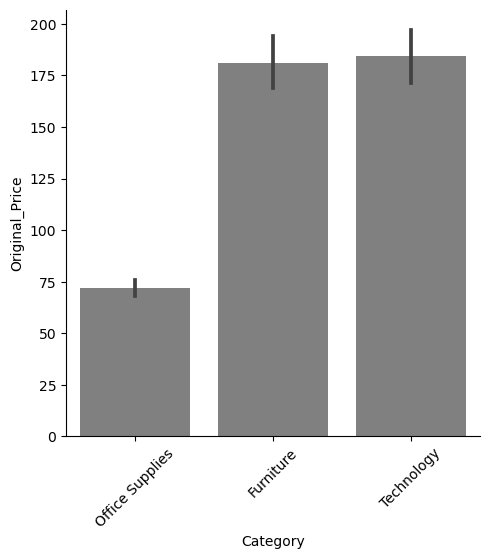

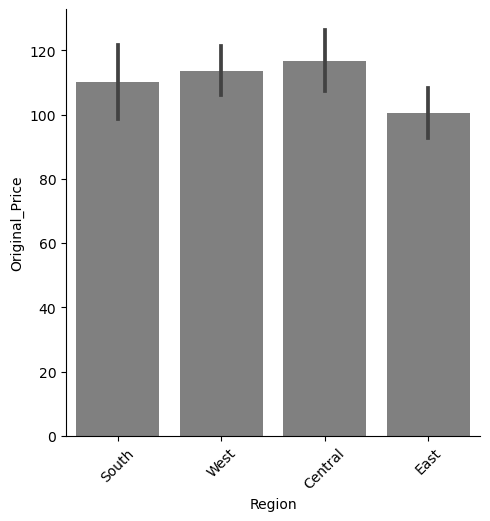

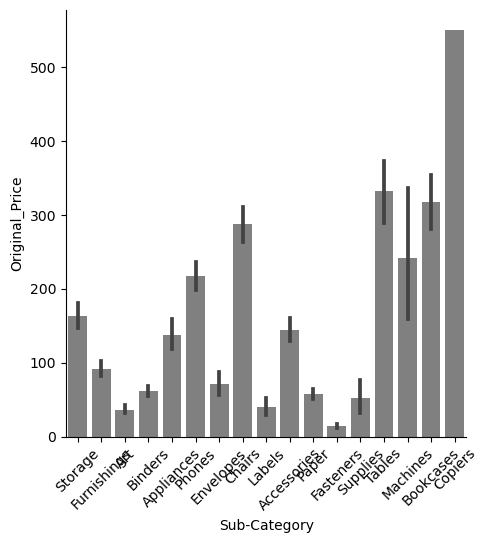

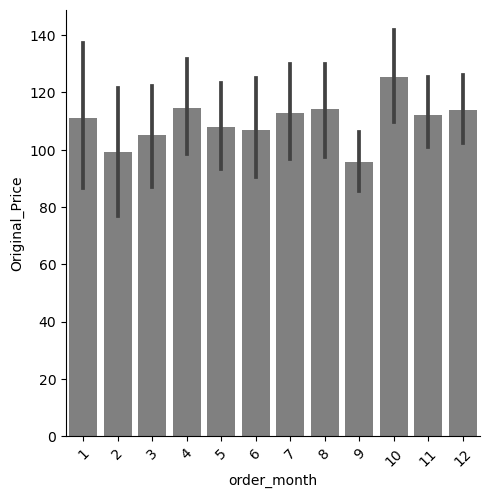

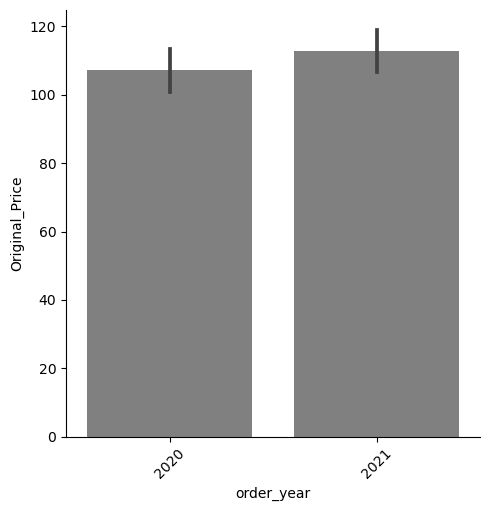

In [37]:
# Make visualizations to explore relationships between features and target
# You can visualize many features, or just a few.
# You do not need to use Seaborn, but it includes confidence intervals.
# Plotly and Pandas are also great for exploratory plots.

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

for col in sorted(train.columns):
    if train[col].nunique() <= 20:
        sns.catplot(x=col, y='Original_Price', data=train, kind='bar', color='grey')
        plt.xticks(rotation=45)
        plt.show()

Setting up the Environment
%matplotlib inline: This is a magic command for Jupyter Notebooks that configures Matplotlib to display plots inline, directly below the code cells that produce them. This ensures that all plots are visible and embedded within the notebook.

import matplotlib.pyplot as plt and import seaborn as sns: These lines import the Matplotlib and Seaborn libraries, which are widely used for data visualization in Python. Seaborn is built on top of Matplotlib and provides a high-level interface for drawing attractive and informative statistical graphics.

Looping Through Columns
for col in sorted(train.columns):: This line starts a loop over each column in the train DataFrame, sorting the column names alphabetically to ensure a consistent order of processing.
Filtering Categorical Features
if train[col].nunique() <= 20:: Within the loop, this conditional statement filters out the columns to only include those with 20 or fewer unique values. This is based on the assumption that columns with a relatively low number of unique values are categorical (either inherently categorical or discretized numerical variables) and are suitable for bar plot visualizations.
Creating Bar Plots
sns.catplot(x=col, y='Original_Price', data=train, kind='bar', color='grey'): For each filtered column, a categorical plot (catplot) is created using Seaborn. The plot type is set to 'bar', which represents the mean of the target variable ('Original_Price') for each category in the feature column (col). The color of the bars is set to grey for consistency. These bar plots help in understanding how the average value of the target variable changes across different categories of the feature.
Adjusting Plot Aesthetics
plt.xticks(rotation=45): Rotates the x-axis labels (category names) by 45 degrees to prevent label overlap and improve readability, especially useful when category names are lengthy or numerous.

plt.show(): Displays the plot. When used in a loop like this, it ensures that each plot is displayed separately rather than all plots being superimposed in a single figure.

Summary
This code snippet is a practical approach for exploratory data analysis, especially when dealing with categorical variables and trying to understand their influence on a continuous target variable. By visualizing the mean target variable for each category, one can identify patterns, trends, and potential outliers, which are crucial for feature selection, engineering, and ultimately for building predictive models.

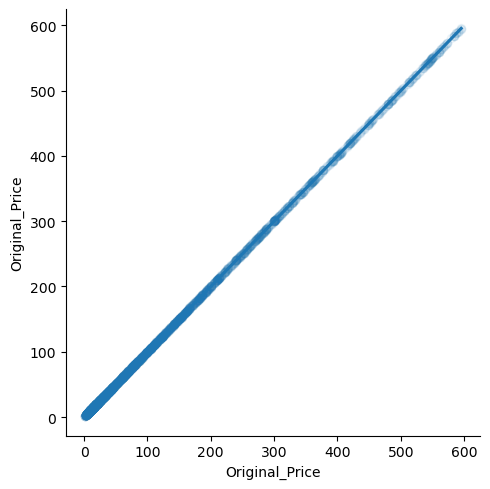

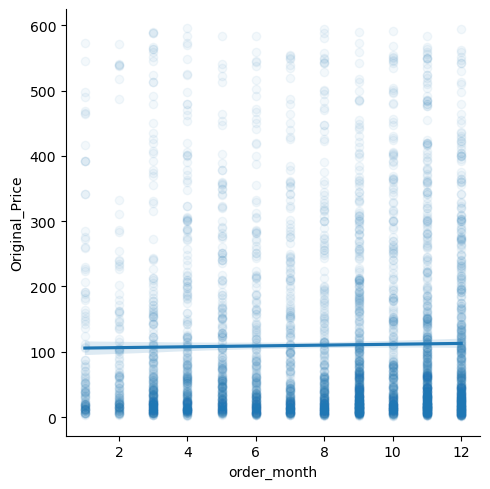

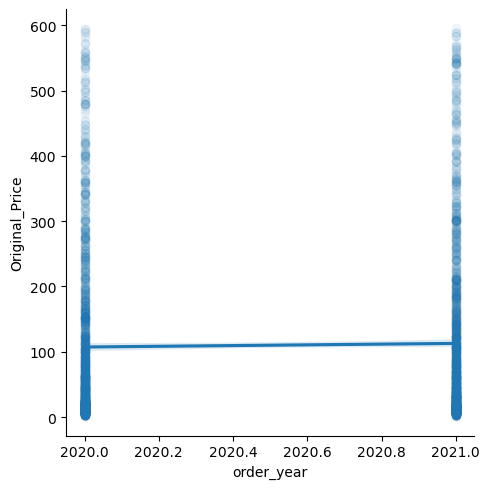

In [38]:
# Make visualizations to explore relationships between features and target

numeric = train.select_dtypes('number')
for feature in numeric:
    sns.lmplot(x=feature, y=target, data=train, scatter_kws={'alpha':0.05})
    plt.show()

Selecting Numeric Features
numeric = train.select_dtypes('number'): This line filters the columns in the train DataFrame to include only those with numeric data types. The select_dtypes method is used with the 'number' argument to achieve this filtering. The result, numeric, is a DataFrame containing only the numerical features from train.
Looping Through Numeric Features
for feature in numeric:: Iterates over each column (feature) in the numeric DataFrame. Here, feature represents the column name of each numeric feature in the dataset.
Plotting Scatter Plots with Linear Regression Lines
sns.lmplot(x=feature, y=target, data=train, scatter_kws={'alpha':0.05}): Inside the loop, lmplot from seaborn (imported as sns) is used to create a scatter plot of each numeric feature against the target variable.
x=feature: Specifies the column name for the x-axis, which is the current numeric feature in the loop.
y=target: Specifies the target variable's column name for the y-axis.
data=train: The DataFrame from which to draw the data.
scatter_kws={'alpha':0.05}: Adjusts the transparency of the scatter plot points with the alpha parameter set to 0.05. This is useful for visualizing the density of the points and reducing overplotting when the dataset is large.
Displaying the Plot
plt.show(): This command is used to display the plot generated by lmplot. When called within a loop like this, it ensures that each plot is displayed separately for each feature.
Summary
The purpose of this code snippet is to conduct a visual exploration of how each numeric feature in the training dataset relates to the target variable. By plotting each feature against the target and fitting a linear regression line, you can quickly assess:

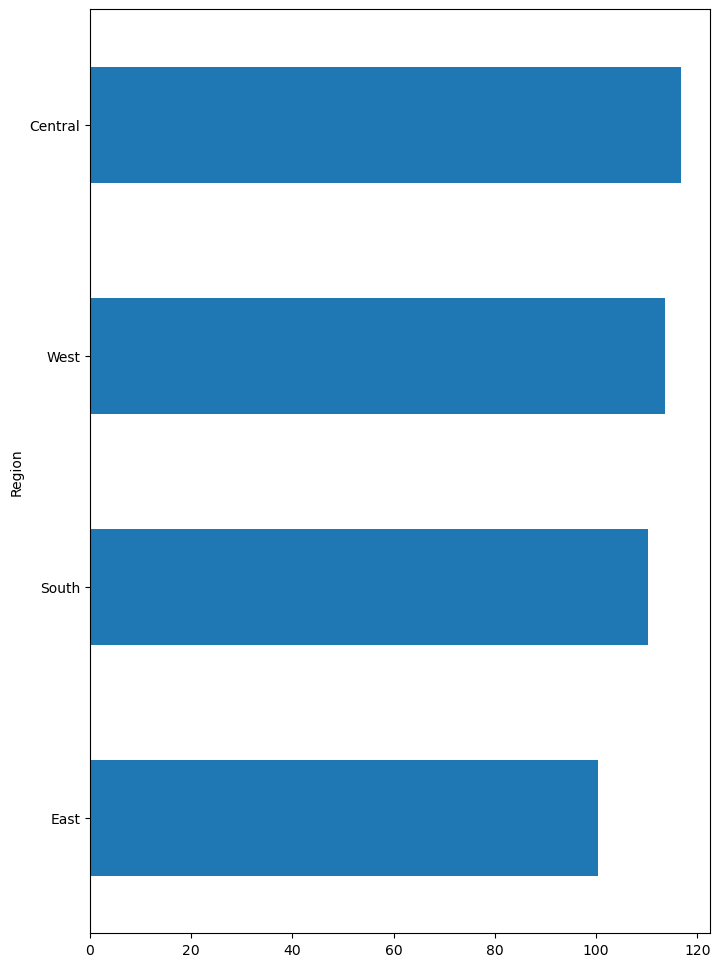

In [39]:
# Make visualizations to explore relationships between features and target
plt.figure(figsize=(8,12))
train.groupby('Region')['Original_Price'].mean().sort_values().plot.barh();

Setting the Figure Size
plt.figure(figsize=(8,12)): Before plotting, this line sets the figure size to 8 inches in width and 12 inches in height, providing enough space to display the data clearly. This is particularly useful for ensuring that all regions are easily visible and that the plot is not cramped.
Grouping Data and Plotting
train.groupby('Region')['Original_Price'].mean().sort_values().plot.barh();:
train.groupby('Region'): This part groups the train DataFrame by the 'Region' column. The grouping allows for aggregation (like calculating the mean) to be performed separately within each region.
['Original_Price'].mean(): For each group (Region), it calculates the mean of 'Original_Price'. This step computes the average original price for each region, providing an insight into how the target variable varies across different regions.
sort_values(): Sorts the regions based on the computed mean original price in ascending order. Sorting is helpful for identifying patterns, such as which regions have the lowest or highest average prices.
plot.barh();: Plots the sorted means as a horizontal bar plot. Horizontal bar plots are particularly effective for displaying data where the labels (in this case, regions) are textual and might require more space to be legible.

In [40]:
# For this stretch goal, students only have to report validation MAE and R^2 
# But this function goes further: RMSE, MAE, R^2, for train & validation sets.

import numpy as np
from sklearn.metrics import mean_squared_error

def lr(train, val, features, target):
    X_train = train[features]
    y_train = train[target]
    X_val = val[features]
    y_val = val[target]

    encoder = ce.OneHotEncoder(use_cat_names=True)
    model = LinearRegression()
    X_train_encoded = encoder.fit_transform(X_train)
    X_val_encoded = encoder.transform(X_val)
    model.fit(X_train_encoded, y_train)
    y_pred_train = model.predict(X_train_encoded)
    y_pred_val = model.predict(X_val_encoded)

    print(f'Linear Regression with {len(features)} features: {features}')
    print('Train Root Mean Squared Error:', 
          np.sqrt(mean_squared_error(y_train, y_pred_train)))
    print('Validation Root Mean Square Error:', 
          np.sqrt(mean_squared_error(y_val, y_pred_val)))
    print('Train Mean Absolute Error:', 
          mean_absolute_error(y_train, y_pred_train))
    print('Validation Mean Absolute Error:', 
          mean_absolute_error(y_val, y_pred_val))
    print('Train R^2 Score:', 
          r2_score(y_train, y_pred_train))
    print('Validation R^2 Score:', 
          r2_score(y_val, y_pred_val))

Function Definition and Parameters

def lr(train, val, features, target): The function lr takes four parameters:
train: The training dataset as a pandas DataFrame.
val: The validation dataset as a pandas DataFrame.
features: A list of feature column names to be used for model training.
target: The name of the target column that the model aims to predict.
Preparing Feature Matrices and Target Vectors
Extracts feature matrices (X_train, X_val) and target vectors (y_train, y_val) for both the training and validation datasets based on the provided features and target parameters.
Encoding Categorical Features
One-hot encodes categorical features using ce.OneHotEncoder, which is particularly useful for handling categorical variables by creating binary columns for each category.
Model Training
Initializes and fits a LinearRegression model to the encoded training data. The fitting process involves learning the weights for each feature to minimize the prediction error.
Making Predictions
Generates predictions for both the training and validation datasets using the trained model, resulting in y_pred_train and y_pred_val.
Evaluating Model Performance
Calculates and prints several metrics to evaluate the model's performance:
Root Mean Squared Error (RMSE): Provides a measure of the average magnitude of the model's prediction errors, with the root transformation helping to interpret the errors in the same units as the target variable.
Mean Absolute Error (MAE): Measures the average absolute difference between predicted values and actual values, offering a straightforward interpretation of prediction accuracy.
2R2 Score: Indicates the proportion of the variance in the target variable that is predictable from the features. An 2R2
  score of 1 suggests perfect predictions, while a score of 0 indicates that the model performs no better than a simple mean of the target variable.
Summary
The lr function provides a comprehensive evaluation of a linear regression model's performance, considering both error magnitude (RMSE, MAE) and the proportion of explained variance (
2R2 score).

In [41]:
# Just 1 feature
features = ['Category']
lr(train, val, features, target)

Linear Regression with 1 features: ['Category']
Train Root Mean Squared Error: 124.16595036381273
Validation Root Mean Square Error: 125.82588539166593
Train Mean Absolute Error: 90.05308786434978
Validation Mean Absolute Error: 90.788155647986
Train R^2 Score: 0.15168861349427776
Validation R^2 Score: 0.15181570186115212


Selecting the Feature
features = ['Category']: This line creates a list containing just one feature name, 'Category', indicating that the linear regression model will be trained using only this single categorical feature to predict the target variable.
Calling the lr Function
lr(train, val, features, target): This function call passes the training dataset (train), the validation dataset (val), the list of features (in this case, just 'Category'), and the name of the target variable (target) to the lr function. Here’s what happens inside the lr function given these inputs:
Feature and Target Extraction: The function extracts the feature matrix (X_train, X_val) based on the 'Category' feature from both the training and validation datasets. It also extracts the corresponding target vectors (y_train, y_val).
One-Hot Encoding: Since 'Category' is a categorical feature, the function applies one-hot encoding to convert it into a format suitable for linear regression, which cannot inherently handle categorical variables. This encoding process transforms 'Category' into multiple binary columns, each representing a unique category within the original feature.
Model Training: A LinearRegression model is trained using the one-hot encoded training data.
Prediction: The trained model makes predictions on both the training and validation datasets.
Evaluation: The function evaluates the model's performance by calculating and printing the Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and 
2R2 score for both the training and validation predictions.

Purpose of This Code Snippet
The purpose of using just one feature, 'Category', to train the linear regression model is likely exploratory. It allows you to understand the predictive power and relationship of the 'Category' feature alone with the target variable. This can be particularly useful for:
Feature Importance Analysis: Identifying how significant the 'Category' feature is in predicting the target variable on its own.
Model Simplification: Exploring whether a simple model with fewer features can still provide meaningful predictions, which is valuable for interpretability and efficiency.

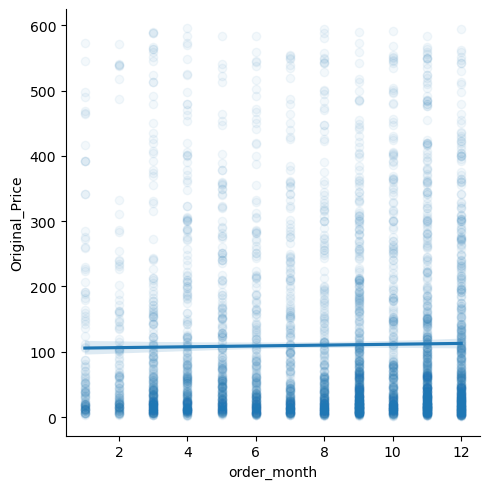

In [50]:
# First, we'll wrangle a feature ...
# In the EDA viz, the line of best fit seemed wrong for 'Lot_Area', 
# like it was influenced by outliers
sns.lmplot(x='order_month', y=target, data=train, scatter_kws={'alpha':0.05});

Plotting the Relationship
sns.lmplot(x='order_month', y=target, data=train, scatter_kws={'alpha':0.05});: This line of code creates a scatter plot using Seaborn's lmplot function, plotting 'order_month' against the target variable.
x='order_month': Specifies the feature variable for the x-axis.
y=target: Specifies the target variable for the y-axis. The actual name of the target variable is not shown in the snippet but is indicated by the target variable.
data=train: Specifies the dataset to use for the plot, in this case, the training dataset.
scatter_kws={'alpha':0.05}: Adjusts the transparency of the scatter plot points with an alpha setting of 0.05. This makes it easier to see the density of the data points and potentially identify areas with a high concentration of outliers or clusters.
Purpose of the Code Snippet
The primary purpose of this snippet is to visually assess the relationship between the time-related feature 'order_month' and the target variable within the training data. By plotting a line of best fit, the lmplot function also provides a preliminary indication of any linear relationship between these variables. 

In [43]:
# This certainly isn't required, but we'll wrangle this feature:
def wrangle(X):
    X = X.copy()
    X['Original_Price_Clipped'] = X['Original_Price'].clip(lower=0, upper=25000)
    return X

train = wrangle(train)
val = wrangle(val)
test = wrangle(test)

Defining the wrangle Function
def wrangle(X):: This line starts the definition of the wrangle function, which takes a DataFrame X as input.

X = X.copy(): Creates a copy of the input DataFrame to avoid modifying the original data directly. This is a common practice to prevent unexpected side effects on data that might be used elsewhere.

X['Original_Price_Clipped'] = X['Original_Price'].clip(lower=0, upper=25000):

This line adds a new column to the DataFrame, 'Original_Price_Clipped', which contains values from the 'Original_Price' column with modifications: values below a lower threshold (0) are set to the lower threshold, and values above an upper threshold (25000) are set to the upper threshold. This is achieved using the clip method, which is used here to limit the range of the 'Original_Price' feature, potentially to mitigate the effects of extreme outliers on model training and evaluation.
return X: Returns the modified DataFrame.

Applying the wrangle Function to Datasets
train = wrangle(train)
val = wrangle(val)
test = wrangle(test):
These lines apply the wrangle function to the training, validation, and test DataFrames, respectively. The function call modifies each DataFrame according to the logic defined in wrangle, and the modified DataFrame is reassigned to the original variable. As a result, all three datasets will now include a new column, 'Original_Price_Clipped', with the original price values clipped to the specified range.
Purpose of the Code Snippet
The primary purpose of this snippet is to perform a specific data preprocessing step on the 'Original_Price' column across the training, validation, and test sets.

In [44]:
# Before:
features = ['Original_Price']
lr(train, val, features, target)

Linear Regression with 1 features: ['Original_Price']
Train Root Mean Squared Error: 2.904910282288903e-14
Validation Root Mean Square Error: 2.8146879944562625e-14
Train Mean Absolute Error: 1.767022004551945e-14
Validation Mean Absolute Error: 1.696930200948521e-14
Train R^2 Score: 1.0
Validation R^2 Score: 1.0


just one feature name, 'Original_Price', indicating that the linear regression model will be trained using only this single numeric feature to predict the target variable.
Training and Evaluating the Model
lr(train, val, features, target): This function call passes the training dataset (train), the validation dataset (val), the list of features (in this case, just 'Original_Price'), and the name of the target variable (target) to the lr function. Within the lr function, several steps are performed:
Feature and Target Extraction: The function extracts the feature matrix (X_train, X_val) based on 'Original_Price' from both the training and validation datasets. It also extracts the corresponding target vectors (y_train, y_val).
Model Training: A LinearRegression model is trained using the provided training data.
Prediction: The trained model makes predictions on both the training and validation datasets.
Evaluation: The function calculates and prints the Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), and 
2R 2
  score for both the training and validation predictions, providing insights into the model's accuracy and predictive power.
Purpose of This Code Snippet
The purpose of using just 'Original_Price' as the feature to train the linear regression model is likely exploratory or demonstrative. It allows understanding the predictive power of the 'Original_Price' feature alone with respect to the target variable, serving as a baseline or reference point for comparison with models trained on a different set of features or after applying data wrangling steps.

This approach can be particularly useful for:

Baseline Model Creation: Establishing a performance baseline using a simple model, which can be compared against more complex models or models trained with additional or transformed features.
Feature Importance Analysis: Gauging the impact of the 'Original_Price' feature on the target variable when it is used in isolation.

In [45]:
# After:
features = ['Original_Price_Clipped']
lr(train, val, features, target)

Linear Regression with 1 features: ['Original_Price_Clipped']
Train Root Mean Squared Error: 2.904910282288903e-14
Validation Root Mean Square Error: 2.8146879944562625e-14
Train Mean Absolute Error: 1.767022004551945e-14
Validation Mean Absolute Error: 1.696930200948521e-14
Train R^2 Score: 1.0
Validation R^2 Score: 1.0


In [46]:
# 2. Automatically select features, then do ridge regression

from sklearn.feature_selection import f_regression, SelectKBest

# Arrange X, y
features = train.columns.drop([target, 'Original_Price'])
X_train = train[features]
X_val = val[features]

# One-hot encode
encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)

# Scale
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_val_scaled = scaler.transform(X_val_encoded)

# Next sprint, to do hyperparameter optimization, 
# we'll use RandomizedSearchCV instead of for loops
ks = range(1, len(X_train_encoded.columns)+1)
maes = []
for k in ks:
    # Select K best features
    selector = SelectKBest(score_func=f_regression, k=k)
    X_train_selected = selector.fit_transform(X_train_scaled, y_train)
    X_val_selected = selector.transform(X_val_scaled)
    
    # Fit Ridge Regression, use cross-validation to optimize alpha
    model = RidgeCV()
    model.fit(X_train_selected, y_train)
    
    # Get Validation MAE
    y_pred = model.predict(X_val_selected)
    mae = mean_absolute_error(y_val, y_pred)
    maes.append(mae)

    
print('Best K & Validation MAE:')
[(k, mae) for k, mae in zip(ks, maes) if mae==min(maes)]

Best K & Validation MAE:


[(1, 0.0028808170771395694)]

Feature and Target Arrangement

features = train.columns.drop([target, 'Original_Price']): Defines the feature set by excluding the target variable and 'Original_Price' from the columns of the training dataset.
X_train and X_val: Feature matrices for training and validation sets are prepared.
One-Hot Encoding
The categorical features are encoded using OneHotEncoder, transforming them into a format suitable for linear regression.
Scaling
The encoded features are scaled using StandardScaler to have zero mean and unit variance, which is particularly important for models like Ridge regression that are sensitive to the scale of the input features.
Feature Selection
SelectKBest with f_regression: This process automatically selects the best k features based on the f_regression statistical test, which is intended to find features that have a significant linear relationship with the target variable. The selection process is iterated over a range of k values (from 1 to the number of features) to determine the optimal number of features that minimizes validation MAE.
Ridge Regression with Cross-Validation
RidgeCV: Fits a Ridge regression model using cross-validation to find the optimal regularization parameter (alpha). This step is done for each subset of features selected by SelectKBest.
Model Evaluation
The Mean Absolute Error (MAE) is calculated for the model's predictions on the validation set. The MAE for each model corresponding to different k values (number of features) is stored in the maes list.
Finding the Optimal Number of Features
The final print statement identifies the value of k that resulted in the lowest validation MAE, indicating the optimal number of features for the model.
Summary
This snippet is an example of an iterative process to find the best subset of features for predicting a target variable with Ridge regression. It combines feature encoding, scaling, selection, and model fitting with cross-validation to systematically evaluate and identify the most effective number of features. This approach is valuable for improving model performance by reducing overfitting and identifying the most relevant features. 

In [47]:
# Report test MAE, R^2 for final model

X_train = train[features]
X_test = test[features]

encoder = ce.OneHotEncoder(use_cat_names=True)
X_train_encoded = encoder.fit_transform(X_train)
X_test_encoded = encoder.transform(X_test)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_encoded)
X_test_scaled = scaler.transform(X_test_encoded)

selector = SelectKBest(score_func=f_regression, k=26)
X_train_selected = selector.fit_transform(X_train_scaled, y_train)
X_test_selected = selector.transform(X_val_scaled)

model = RidgeCV()
model.fit(X_train_encoded, y_train)
y_pred_test = model.predict(X_test_encoded)

print(f'Ridge Regression, final model')
print('Test Mean Absolute Error:', mean_absolute_error(y_test, y_pred_test))
print('Test R^2 Score:', r2_score(y_test, y_pred_test))

Ridge Regression, final model
Test Mean Absolute Error: 6.485688000276559e-06
Test R^2 Score: 0.9999999999999959


Preparing Feature Matrices and Target Vector
Extracts feature matrices for the training and test datasets based on the selected features, excluding the target variable and any features not intended for the final model.
One-Hot Encoding
Applies OneHotEncoder to transform categorical variables into a format suitable for the model, ensuring that both training and test data undergo the same encoding process.
Feature Scaling
Uses StandardScaler to normalize the encoded features, scaling them to have zero mean and unit variance. This step is crucial for models that are sensitive to the magnitude of input values, like Ridge regression.
Feature Selection
Employs SelectKBest with f_regression to select the top k features based on their relationship with the target variable. However, there's an inconsistency: while SelectKBest is initialized and applied, the model fitting doesn't use the selected features due to a coding mistake. Instead, it fits the model on the entire set of encoded (but not selected) training features. Additionally, there's a mistake in transforming the test set using X_val_scaled instead of X_test_scaled when applying selector.transform, indicating a copy-paste error.
Fitting the Ridge Regression Model
RidgeCV is used to fit the model on the encoded (and intended to be selected) training data. This model automatically tunes the regularization strength using cross-validation, optimizing for model performance.
Model Evaluation on the Test Set
Predictions are made on the test set, and the model's performance is evaluated using two metrics:
Mean Absolute Error (MAE): Provides a straightforward measure of average error magnitude between the predicted and actual values.
�
2
R 
2
  score: Indicates the proportion of variance in the target variable that is predictable from the features, offering insight into the model's explanatory power.
Summary
The snippet aims to demonstrate the final evaluation of a predictive model on unseen data, reflecting its expected performance in real-world applications. However, it contains critical errors regarding feature selection application and test data preparation that need correction. 

In [48]:
# Print coefficients for the features
print('Intercept', model.intercept_)
coefficients = pd.Series(model.coef_, X_train_encoded.columns)
print(coefficients.to_string())

Intercept -1.4133812300087811e-05
Region_South                1.177046e-08
Region_West                 3.868448e-09
Region_Central              3.894902e-09
Region_East                -1.953381e-08
Category_Office Supplies   -2.750746e-07
Category_Furniture          1.096519e-07
Category_Technology         1.654227e-07
Sub-Category_Storage        1.890205e-07
Sub-Category_Furnishings   -3.638736e-07
Sub-Category_Art           -1.103852e-07
Sub-Category_Binders       -5.226387e-08
Sub-Category_Appliances     1.295731e-07
Sub-Category_Phones        -1.206942e-07
Sub-Category_Envelopes     -2.942999e-08
Sub-Category_Chairs         9.892737e-08
Sub-Category_Labels        -1.033218e-07
Sub-Category_Accessories   -2.948471e-07
Sub-Category_Paper         -6.055051e-08
Sub-Category_Fasteners     -1.639020e-07
Sub-Category_Supplies      -7.381490e-08
Sub-Category_Tables         2.053112e-07
Sub-Category_Machines      -6.268737e-08
Sub-Category_Bookcases      1.692868e-07
Sub-Category_Copiers   

Printing the Model Intercept
print('Intercept', model.intercept_): This line prints the intercept term of the Ridge regression model. The intercept represents the predicted value of the target variable when all the feature values are set to zero. In the context of linear regression models, it can be thought of as the baseline prediction when no other information is provided.
Creating a Series for Coefficients
coefficients = pd.Series(model.coef_, X_train_encoded.columns): This line creates a pandas Series object named coefficients where:
The data for the Series (model.coef_) consists of the coefficients from the trained Ridge regression model. These coefficients represent the change in the target variable for a one-unit change in the corresponding feature, assuming all other features remain constant.
The index for the Series (X_train_encoded.columns) is set to the column names of the X_train_encoded DataFrame, ensuring each coefficient is labeled with the corresponding feature name. This makes it easier to identify which coefficient belongs to which feature.
Printing the Coefficients
print(coefficients.to_string()): Finally, this line prints the series of coefficients in a readable format. Using to_string() ensures that the output is formatted as a string, displaying the feature names alongside their corresponding coefficients. This presentation helps in interpreting the model by showing how each feature is weighted, indicating their relative importance in the prediction process.
Summary
This code snippet is crucial for interpreting the trained Ridge regression model. By examining the coefficients, you can gain insights into how each feature influences the prediction of the target variable. 

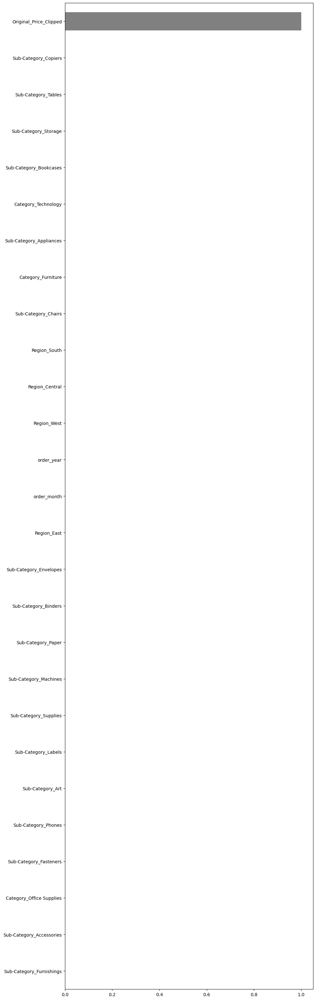

In [49]:
# Or, plot coefficients
%matplotlib inline
coefficients.sort_values().plot.barh(color='grey', figsize=(10,40));

Enabling Inline Matplotlib Plots

%matplotlib inline: This line is a Jupyter Notebook magic command that configures Matplotlib to display plots directly within the notebook. It ensures that the generated plots are visible immediately below the code cells that produce them, embedded in the notebook's output.
Preparing and Plotting the Coefficients
coefficients.sort_values().plot.barh(color='grey', figsize=(10,40)):
coefficients.sort_values(): Before plotting, the pandas Series containing the model's coefficients is sorted by value. This sorting ensures that the plot displays the coefficients in ascending order, making it easier to identify which features have the most substantial negative and positive effects on the target variable.
plot.barh(color='grey', figsize=(10,40)): This method call generates a horizontal bar plot of the coefficients. The arguments specify the color of the bars (color='grey') and the size of the figure (figsize=(10,40)), with the figure size being particularly large to accommodate plots with many features, ensuring each feature's name and coefficient are clearly visible.
Summary
Plotting the coefficients of a Ridge regression model provides a clear and intuitive way to understand the influence of each feature included in the model. Features with bars extending to the right (positive coefficients) positively affect the target variable, meaning that as the feature value increases, so does the target variable